# Analyse de "CYCLES"

In [227]:
import pandas as pd
import numpy as np
import math

import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.filters.hp_filter import hpfilter

from tools import *

from sklearn.preprocessing import StandardScaler

                  date    country  rpp_value  cgdp_value   cr_value  spr_value
0  1960-03-31 00:00:00  Argentina        NaN         NaN        NaN        NaN
1  1960-06-30 00:00:00  Argentina        NaN         NaN        NaN        NaN
2  1960-09-30 00:00:00  Argentina        NaN         NaN        NaN        NaN
3            31dec1960  Argentina        NaN         NaN  56.659502        NaN
4  1961-03-31 00:00:00  Argentina        NaN         NaN  57.354587        NaN
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15872 entries, 0 to 15871
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        15872 non-null  object 
 1   country     15872 non-null  object 
 2   rpp_value   7780 non-null   float64
 3   cgdp_value  8783 non-null   float64
 4   cr_value    8824 non-null   float64
 5   spr_value   8076 non-null   float64
dtypes: float64(4), object(2)
memory usage: 744.1+ KB
None
Valeurs manquantes par colonne 

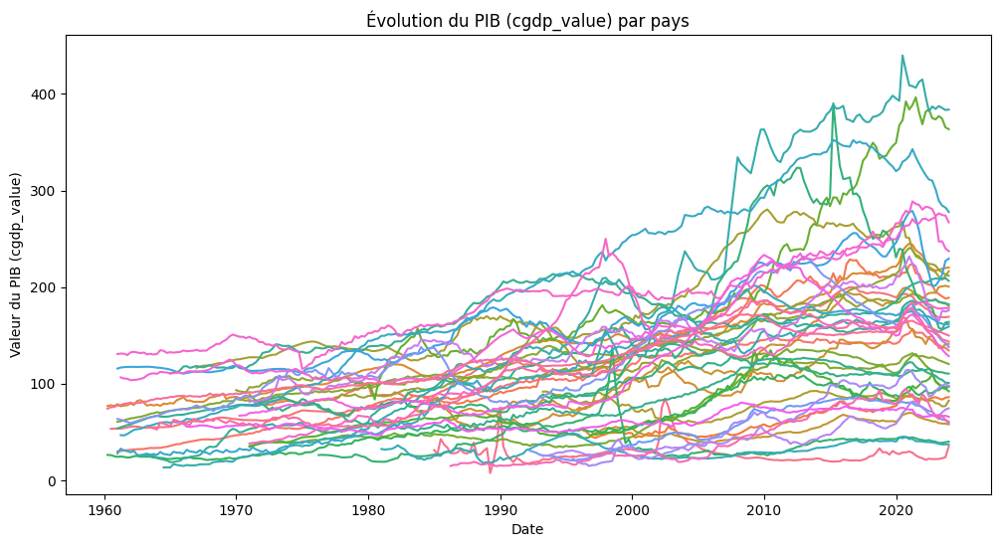

In [228]:
# Charger la section "CYCLES" du fichier Excel
file_path = './data/Case study - Samuel LIGONNIERE - M2IMSD Evry.xlsx'
cycles = pd.read_excel(file_path, sheet_name="CYCLES")

# Afficher un aperçu des données
print(cycles.head())
print(cycles.info())

# Uniformiser le format des dates
cycles['date'] = pd.to_datetime(cycles['date'], errors='coerce')

# Vérifier les valeurs manquantes par colonne
missing_values = cycles.isnull().sum()

# Distribution des valeurs pour chaque colonne (après nettoyage des dates)
summary_stats = cycles.describe()

# Afficher les informations de nettoyage
print("Valeurs manquantes par colonne :")
print(missing_values)
print("\nStatistiques descriptives :")
print(summary_stats)

# Supprimer les lignes où tous les indicateurs sont manquants
indicators = ['rpp_value', 'cgdp_value', 'cr_value', 'spr_value']
cycles_cleaned = cycles.dropna(subset=indicators, how='all')

# Vérifier les dimensions après nettoyage
cleaned_rows = cycles_cleaned.shape[0]
print(f"\nNombre de lignes après nettoyage : {cleaned_rows}")

# Tracer les séries temporelles pour un indicateur (exemple pour 'cgdp_value')
plt.figure(figsize=(12, 6))
sns.lineplot(data=cycles_cleaned, x='date', y='cgdp_value', hue='country', legend=False, alpha=1)
plt.title('Évolution du PIB (cgdp_value) par pays')
plt.xlabel('Date')
plt.ylabel('Valeur du PIB (cgdp_value)')
plt.show()


# Visualisation des données brutes

In [229]:
cycles = pd.read_excel(file_path, sheet_name="CYCLES")
cycles['date'] = pd.to_datetime(cycles['date'])

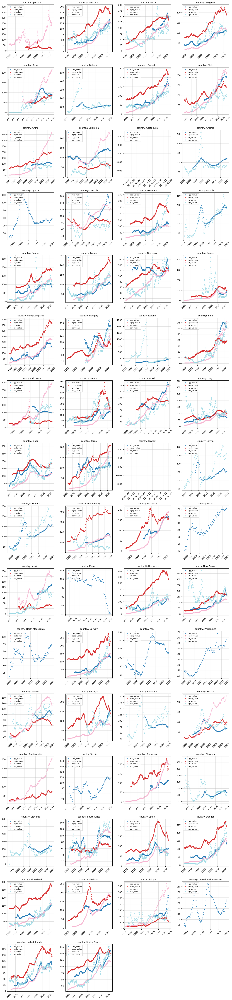

In [230]:
countries = cycles['country'].unique()

plot_time_series(cycles, "country", countries, ["rpp_value", "cgdp_value", "cr_value", "spr_value"])

On voit qu'il y a beaucoup de données manquantes pour certains pays :
- Argentina : rpp, spr
- Bulgaria : cgdp, cr
- Costa Rica : tout
- Croatia : cr, rpp
- Cyprus : cgdp, cr, spr
- Estonia : cgdp, cr
- Hong Kong SAR : spr
- Iceland : rpp, cgdp
- Kuwait : tout
- Latvia : cgdp, cr
- Lithuania : cgdp, cr
- Malaysia : spr
- Malta : cgdp, cr, spr
- Morocco : cgdp, cr, spr
- Macedonia : cgdp, cr, spr
- Peru : cgdp, cr, spr
- Philippines : cgdp, cr, spr
- Romania : cgdp, cr
- Saudi Arabia : rpp, spr
- Serbia : cgdp, cr, spr
- Singapore : spr,
- Slovakia : cgdp, cr
- Slovenia : cgdp, cr
- Thailand : spr
- United Arab Emirates : cgdp, cr, spr

Or nous avons besoins de toutes les variables par chaque pays afin d'analyser entre elles. Si celle-ci manque dans un pays, elle ne nous servira pas dans notre analyse.  
Nous pouvons donc **supprimer tout ces pays de notre dataset**.

In [231]:
cycles_processed = cycles.copy()
countries_to_remove = [
    "Argentina",
    "Bulgaria",
    "Costa Rica",
    "Croatia",
    "Cyprus",
    "Estonia",
    "Hong Kong SAR",
    "Iceland",
    "Kuwait",
    "Latvia",
    "Lithuania",
    "Malaysia",
    "Malta",
    "Morocco",
    "North Macedonia",
    "Peru",
    "Philippines",
    "Romania",
    "Saudi Arabia",
    "Serbia",
    "Singapore",
    "Slovakia",
    "Slovenia",
    "Thailand",
    "United Arab Emirates"
]

cycles_processed = cycles_processed[~cycles_processed["country"].isin(countries_to_remove)]
print(cycles_processed['country'].unique(), f"\nfrom {len(cycles['country'].unique())} to {len(cycles_processed["country"].unique())}")

['Australia' 'Austria' 'Belgium' 'Brazil' 'Canada' 'Chile' 'China'
 'Colombia' 'Czechia' 'Denmark' 'Finland' 'France' 'Germany' 'Greece'
 'Hungary' 'India' 'Indonesia' 'Ireland' 'Israel' 'Italy' 'Japan' 'Korea'
 'Luxembourg' 'Mexico' 'Netherlands' 'New Zealand' 'Norway' 'Poland'
 'Portugal' 'Russia' 'South Africa' 'Spain' 'Sweden' 'Switzerland'
 'Türkiye' 'United Kingdom' 'United States'] 
from 62 to 37


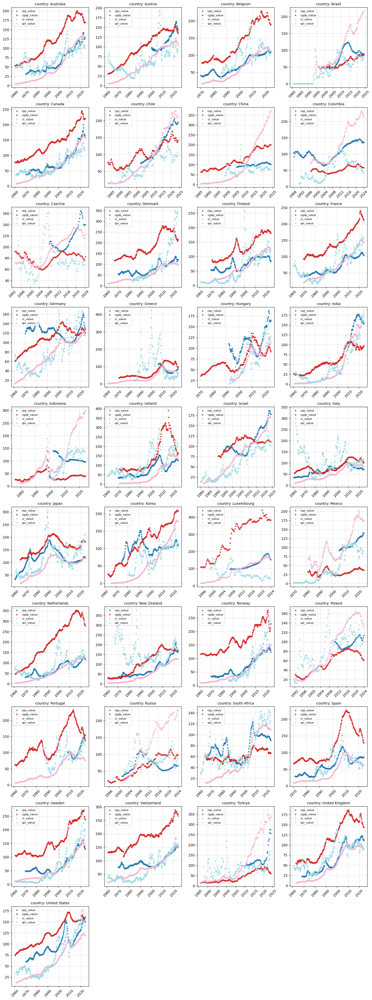

In [232]:
countries = cycles_processed['country'].unique()
plot_time_series(cycles_processed, "country", countries, ["rpp_value", "cgdp_value", "cr_value", "spr_value"])

## Filter only last december values

In [233]:
# eoy = end of year
cycles_processed_filter_eoy = cycles_processed.copy()
cycles_processed_filter_eoy = cycles_processed_filter_eoy[cycles_processed_filter_eoy["date"].dt.month == 12][cycles_processed_filter_eoy["date"].dt.day == 31]
cycles_processed_filter_eoy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2368 entries, 259 to 15871
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        2368 non-null   datetime64[ns]
 1   country     2368 non-null   object        
 2   rpp_value   1460 non-null   float64       
 3   cgdp_value  1929 non-null   float64       
 4   cr_value    1923 non-null   float64       
 5   spr_value   1774 non-null   float64       
dtypes: datetime64[ns](1), float64(4), object(1)
memory usage: 129.5+ KB


C:\Users\-\AppData\Local\Temp\ipykernel_16312\2552276703.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cycles_processed_filter_eoy = cycles_processed_filter_eoy[cycles_processed_filter_eoy["date"].dt.month == 12][cycles_processed_filter_eoy["date"].dt.day == 31]


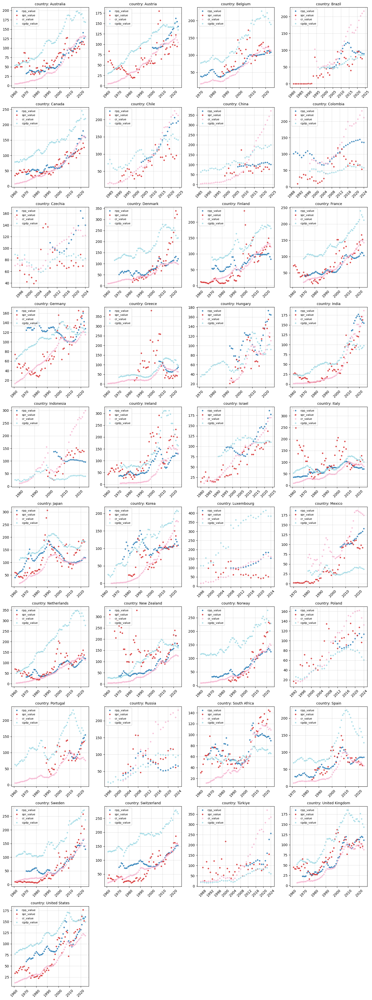

In [234]:
plot_time_series(cycles_processed_filter_eoy, "country", countries, ['rpp_value', 'spr_value', 'cr_value', 'cgdp_value'])

## NaN Values

In [235]:
cycles_processed_filter_eoy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2368 entries, 259 to 15871
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        2368 non-null   datetime64[ns]
 1   country     2368 non-null   object        
 2   rpp_value   1460 non-null   float64       
 3   cgdp_value  1929 non-null   float64       
 4   cr_value    1923 non-null   float64       
 5   spr_value   1774 non-null   float64       
dtypes: datetime64[ns](1), float64(4), object(1)
memory usage: 129.5+ KB


In [236]:
nan_values_per_country = get_nan_values_sup_ratio(cycles_processed_filter_eoy, colonne_groupe='country', to_display=False)
nan_values_per_country.head()

country,Australia,Austria,Belgium,Brazil,Canada,Chile,China,Colombia,Czechia,Denmark,...,Poland,Portugal,Russia,South Africa,Spain,Sweden,Switzerland,Türkiye,United Kingdom,United States
rpp_value,15.6250,62.5000,15.625,64.0625,15.6250,65.6250,70.3125,43.7500,75.0000,15.6250,...,78.125,75.00,64.0625,9.3750,17.1875,15.6250,15.6250,78.125,12.5000,15.6250
cgdp_value,0.0000,0.0000,15.625,56.2500,0.0000,35.9375,39.0625,56.2500,51.5625,9.3750,...,50.000,0.00,54.6875,7.8125,15.6250,1.5625,0.0000,40.625,4.6875,0.0000
cr_value,0.0000,0.0000,15.625,51.5625,0.0000,35.9375,39.0625,56.2500,51.5625,0.0000,...,50.000,0.00,64.0625,7.8125,15.6250,1.5625,0.0000,40.625,4.6875,0.0000
spr_value,1.5625,1.5625,40.625,32.8125,1.5625,46.8750,60.9375,48.4375,53.1250,35.9375,...,50.000,43.75,65.6250,1.5625,39.0625,1.5625,1.5625,43.750,1.5625,1.5625


Affichons uniquement les pays où il y a au moins 1 indicateurs avec plus de 50% de valeurs nulles.

In [237]:
filtered_df = nan_values_per_country.loc[:, (nan_values_per_country >= 50).any(axis=0)]

# Afficher le résultat
print(filtered_df)

country     Austria   Brazil    Chile    China  Colombia  Czechia   Greece  \
rpp_value   62.5000  64.0625  65.6250  70.3125   43.7500  75.0000  71.8750   
cgdp_value   0.0000  56.2500  35.9375  39.0625   56.2500  51.5625  15.6250   
cr_value     0.0000  51.5625  35.9375  39.0625   56.2500  51.5625   0.0000   
spr_value    1.5625  32.8125  46.8750  60.9375   48.4375  53.1250  39.0625   

country     Hungary    India  Indonesia   Israel  Luxembourg   Mexico  Poland  \
rpp_value   50.0000  76.5625    65.6250  53.1250     73.4375  70.3125  78.125   
cgdp_value  15.6250   0.0000    25.0000  46.8750     54.6875  31.2500  50.000   
cr_value    50.0000   0.0000    29.6875  32.8125     54.6875  31.2500  50.000   
spr_value   51.5625   1.5625    59.3750  31.2500     60.9375  15.6250  50.000   

country     Portugal   Russia  Türkiye  
rpp_value      75.00  64.0625   78.125  
cgdp_value      0.00  54.6875   40.625  
cr_value        0.00  64.0625   40.625  
spr_value      43.75  65.6250   43.750 

Exemple de lecture :
- La Tchéquie a :
  - 75% de valeurs manquantes pour rpp_value
  - 51% de valeurs manquantes pour cgdp_value
  - 51% de valeurs manquantes pour cr_value
  - 53% de valeurs manquantes pour spr_value
- etc...

In [238]:
# countries_to_remove = filtered_df.columns.values

In [239]:
# cycles_processed_filter_eoy = cycles_processed_filter_eoy[~cycles_processed_filter_eoy['country'].isin(countries_to_remove)]

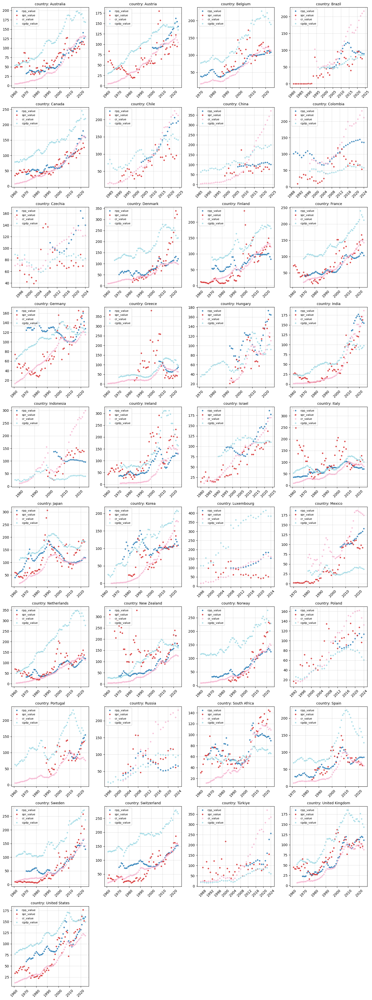

In [240]:
countries = cycles_processed_filter_eoy['country'].unique()
plot_time_series(cycles_processed_filter_eoy, "country", countries, ['rpp_value', 'spr_value', 'cr_value', 'cgdp_value'])

In [241]:
print(cycles_processed_filter_eoy.info())
print(len(cycles_processed_filter_eoy))

<class 'pandas.core.frame.DataFrame'>
Index: 2368 entries, 259 to 15871
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        2368 non-null   datetime64[ns]
 1   country     2368 non-null   object        
 2   rpp_value   1460 non-null   float64       
 3   cgdp_value  1929 non-null   float64       
 4   cr_value    1923 non-null   float64       
 5   spr_value   1774 non-null   float64       
dtypes: datetime64[ns](1), float64(4), object(1)
memory usage: 129.5+ KB
None
2368


Il y a encore des variables qui ont des valeurs manquantes, nous allons les interpoler.

### Interpolation des valeurs manquantes

In [242]:
cycles_processed_filter_eoy['year'] = cycles_processed_filter_eoy['date'].dt.year.astype(int)
if 'date' in cycles_processed_filter_eoy.columns:
  cycles_processed_filter_eoy.drop(columns=['date'], inplace=True)
cycles_processed_filter_eoy.head()

,country,rpp_value,cgdp_value,cr_value,spr_value,year
259,Australia,NaN,53.8,4.846306,47.717278,1960
263,Australia,NaN,55.5,4.908690,50.291227,1961
267,Australia,NaN,54.4,5.125731,50.060163,1962
271,Australia,NaN,54.8,5.595674,60.970866,1963
275,Australia,NaN,55.4,6.029988,57.566995,1964


In [243]:
cycles_processed_filter_eoy_interpolated = impute_nan_values_time_series(cycles_processed_filter_eoy)
cycles_processed_filter_eoy_interpolated.head()

,year,country,rpp_value,cgdp_value,cr_value,spr_value
0,1960,Australia,NaN,53.8,4.846306,47.717278
1,1961,Australia,NaN,55.5,4.908690,50.291227
2,1962,Australia,NaN,54.4,5.125731,50.060163
3,1963,Australia,NaN,54.8,5.595674,60.970866
4,1964,Australia,NaN,55.4,6.029988,57.566995


In [244]:
cycles_processed_filter_eoy_interpolated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2368 entries, 0 to 2367
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   year        2368 non-null   int64  
 1   country     2368 non-null   object 
 2   rpp_value   1460 non-null   float64
 3   cgdp_value  1929 non-null   float64
 4   cr_value    1923 non-null   float64
 5   spr_value   1811 non-null   float64
dtypes: float64(4), int64(1), object(1)
memory usage: 111.1+ KB


Nous venons de **combler les valeurs nulles se trouvant entre les années manquantes**.

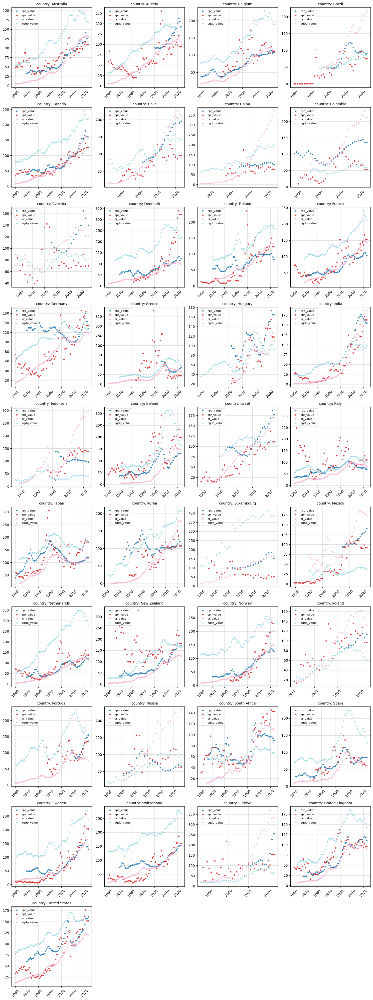

In [245]:
plot_time_series(cycles_processed_filter_eoy_interpolated, "country", cycles_processed_filter_eoy_interpolated['country'].unique(), ['rpp_value', 'spr_value', 'cr_value', 'cgdp_value'], col_date='year')

Malheureusement, pas toutes les variables ont la même plage de date de valeurs... Il va falloir synchroniser ces dates, quitte à perdre des données.

In [246]:
cycles_processed_filter_eoy_interpolated.head()

,year,country,rpp_value,cgdp_value,cr_value,spr_value
0,1960,Australia,NaN,53.8,4.846306,47.717278
1,1961,Australia,NaN,55.5,4.908690,50.291227
2,1962,Australia,NaN,54.4,5.125731,50.060163
3,1963,Australia,NaN,54.8,5.595674,60.970866
4,1964,Australia,NaN,55.4,6.029988,57.566995


In [247]:
selected_variables = ['rpp_value', 'cgdp_value', 'cr_value', 'spr_value']

In [248]:
cycles_processed_filter_eoy_interpolated = align_date_ranges(cycles_processed_filter_eoy_interpolated, 'country', 'year', selected_variables)
cycles_processed_filter_eoy_interpolated.head()

,year,country,rpp_value,cgdp_value,cr_value,spr_value
0,1970,Australia,32.4367,62.4,9.763825,66.374039
1,1971,Australia,34.1111,61.8,10.055262,61.761449
2,1972,Australia,36.7062,62.7,10.501544,73.306428
3,1973,Australia,41.0876,67.2,12.216656,52.346214
4,1974,Australia,40.1630,72.4,13.607510,30.332724


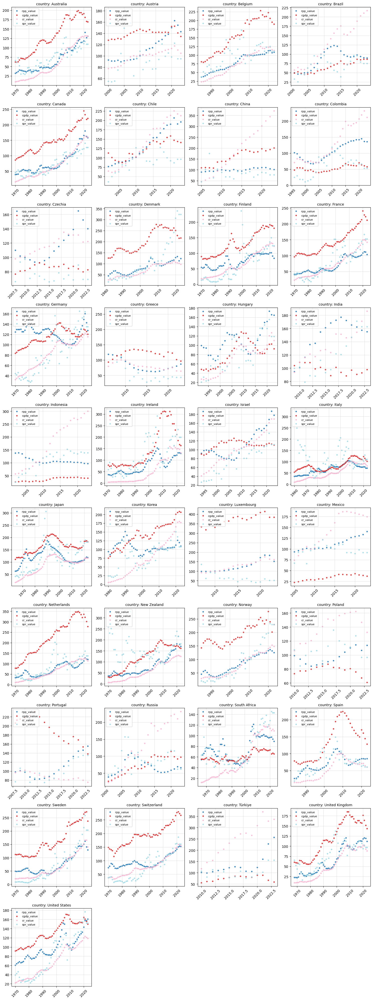

In [249]:
plot_time_series(cycles_processed_filter_eoy_interpolated, "country", cycles_processed_filter_eoy_interpolated['country'].unique(), selected_variables, col_date='year')

# HP filter & cycles normalization

In [250]:
def apply_hp_filter(df, year_col='year', value_col='value', lamb=1600):
    """
    Applique le filtre Hodrick-Prescott à une série temporelle.

    Args:
        df (pd.DataFrame): DataFrame contenant les colonnes 'year' et 'value'.
        year_col (str): Nom de la colonne contenant les années (int).
        value_col (str): Nom de la colonne contenant les valeurs de la série temporelle.
        lamb (float): Paramètre de lissage pour le filtre HP (par défaut 1600 pour données annuelles).

    Returns:
        pd.DataFrame: DataFrame avec colonnes supplémentaires 'trend' et 'cycle'.
    """
    # S'assurer que les données sont triées par 'year'
    df = df.sort_values(by=year_col).reset_index(drop=True)
    
    # Appliquer le filtre HP
    cycle, trend = hpfilter(df[value_col], lamb=lamb)
    
    # Ajouter les colonnes 'trend' et 'cycle' au DataFrame
    df[value_col + '_trend'] = trend
    df[value_col + '_cycle'] = cycle
    
    return df

In [251]:
cycles_processed_filter_eoy_interpolated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1387 entries, 0 to 1386
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   year        1387 non-null   int64  
 1   country     1387 non-null   object 
 2   rpp_value   1387 non-null   float64
 3   cgdp_value  1387 non-null   float64
 4   cr_value    1387 non-null   float64
 5   spr_value   1387 non-null   float64
dtypes: float64(4), int64(1), object(1)
memory usage: 65.1+ KB


In [252]:
hp_lambda = 400000

final_hp = []
for c in cycles_processed_filter_eoy_interpolated['country'].unique():
  df_per_country = cycles_processed_filter_eoy_interpolated[cycles_processed_filter_eoy_interpolated['country'] == c]
  reference_year = df_per_country['year'].min()
  for v in selected_variables:
    df_per_country = apply_hp_filter(df_per_country, value_col=v, lamb=hp_lambda)
    
    # normalisation
    cycle_reference_value = df_per_country[df_per_country['year'] == reference_year][f'{v}_cycle'].values[0]
    df_per_country[f'{v}_cycle_normalized'] = df_per_country[f'{v}_cycle'] / cycle_reference_value
  final_hp.append(df_per_country)

cycles_processed_filter_eoy_interpolated_hp = pd.concat(final_hp, ignore_index=True)
cycles_processed_filter_eoy_interpolated_hp.head()

,year,country,rpp_value,cgdp_value,cr_value,spr_value,rpp_value_trend,rpp_value_cycle,rpp_value_cycle_normalized,cgdp_value_trend,cgdp_value_cycle,cgdp_value_cycle_normalized,cr_value_trend,cr_value_cycle,cr_value_cycle_normalized,spr_value_trend,spr_value_cycle,spr_value_cycle_normalized
0,1970,Australia,32.4367,62.4,9.763825,66.374039,17.341553,15.095147,1.000000,56.486108,5.913892,1.000000,-10.215356,19.979181,1.000000,34.124205,32.249834,1.000000
1,1971,Australia,34.1111,61.8,10.055262,61.761449,19.203306,14.907794,0.987589,59.299733,2.500267,0.422779,-7.646934,17.702196,0.886032,35.588990,26.172459,0.811553
2,1972,Australia,36.7062,62.7,10.501544,73.306428,21.065096,15.641104,1.036168,62.113373,0.586627,0.099195,-5.078462,15.580006,0.779812,37.053855,36.252573,1.124117
3,1973,Australia,41.0876,67.2,12.216656,52.346214,22.926999,18.160601,1.203075,64.927049,2.272951,0.384341,-2.509845,14.726501,0.737092,38.518947,13.827267,0.428755
4,1974,Australia,40.1630,72.4,13.607510,30.332724,24.789129,15.373871,1.018465,67.740783,4.659217,0.787843,0.059049,13.548461,0.678129,39.984503,-9.651779,-0.299281


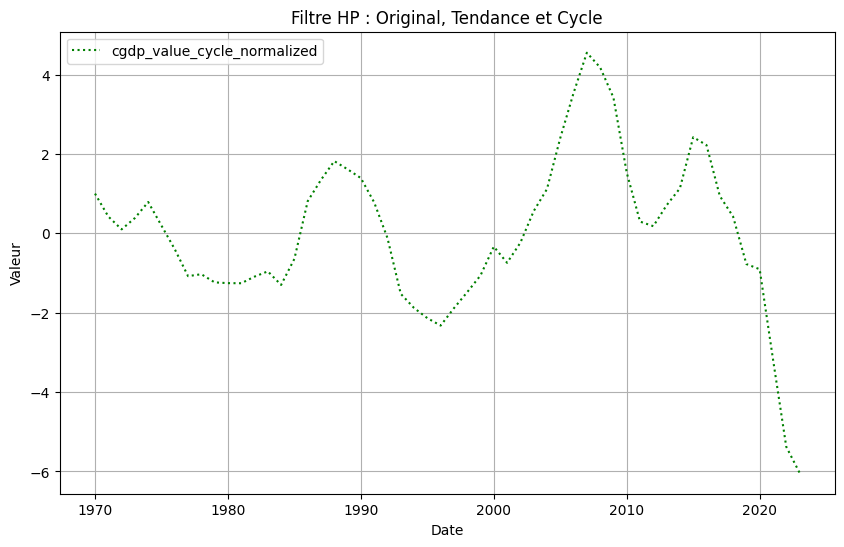

In [253]:
df_to_plot = cycles_processed_filter_eoy_interpolated_hp[cycles_processed_filter_eoy_interpolated_hp['country'] == 'Australia']
value_col = 'cgdp_value'
trend = value_col + '_trend'
cycle = value_col + '_cycle_normalized'

plt.figure(figsize=(10, 6))
# plt.plot(df_to_plot.index, df_to_plot[value_col], label='Original', color='blue')
# plt.plot(df_to_plot.index, df_to_plot[trend], label=trend, color='red', linestyle='--')
plt.plot(df_to_plot['year'], df_to_plot[cycle], label=cycle, color='green', linestyle=':')
plt.legend()
plt.title('Filtre HP : Original, Tendance et Cycle')
plt.xlabel('Date')
plt.ylabel('Valeur')
plt.grid(True)
plt.show()

# PCA

Maintenant, il faut aggréger les 4 variables en une seul. Pour se faire, on va utiliser le PCA.

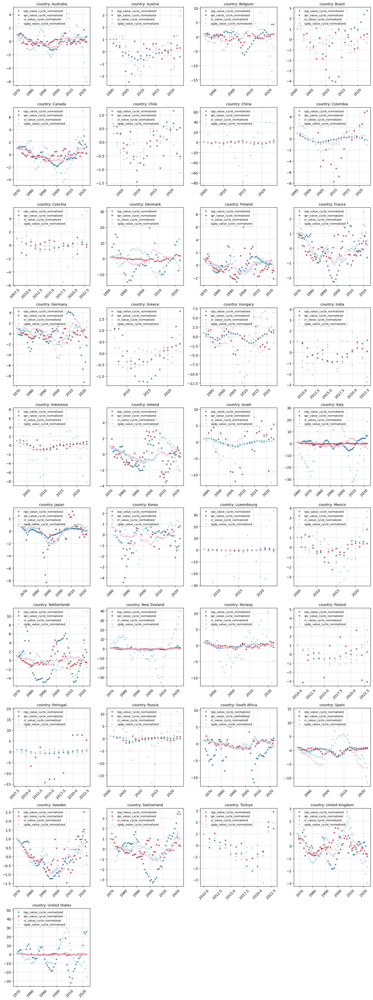

In [254]:
plot_time_series(cycles_processed_filter_eoy_interpolated_hp, "country", cycles_processed_filter_eoy_interpolated_hp['country'].unique(), ['rpp_value_cycle_normalized', 'spr_value_cycle_normalized', 'cr_value_cycle_normalized', 'cgdp_value_cycle_normalized'], col_date='year')

In [255]:
from sklearn.decomposition import PCA

def pca_weighted_mean_by_country(df, selected_variables):
  """
  Applique un PCA par pays sur les composantes cycliques normalisées et calcule la moyenne pondérée
  de ces composantes pour chaque pays.
  
  :param df: DataFrame contenant les variables cycliques normalisées et une colonne 'country'
  :param selected_variables: Liste des variables cycliques normalisées à utiliser pour le PCA
  :return: DataFrame avec une nouvelle colonne contenant la moyenne pondérée pour chaque pays
  """
  
  # Sélectionner uniquement les colonnes des composantes cycliques normalisées
  cycle_columns = [f'{var}_cycle_normalized' for var in selected_variables]
  
  # Créer une liste pour stocker les résultats
  results = []
  
  # Itérer sur chaque pays unique
  for country in df['country'].unique():
    # Filtrer les données pour le pays actuel
    df_country = df[df['country'] == country]
    
    # Identifier les dates communes pour toutes les colonnes sélectionnées
    common_dates = df_country.dropna(subset=cycle_columns)['year']
    
    # Garder uniquement les lignes correspondant aux dates communes
    df_country = df_country[df_country['year'].isin(common_dates)]
    
    # Vérifier si le pays a plus d'une observation pour appliquer le PCA
    if len(df_country) > 1:
      # Extraire les valeurs des composantes cycliques normalisées pour ce pays
      X = df_country[cycle_columns].values
      
      # Appliquer le PCA
      pca = PCA()
      pca.fit(X)
      
      # Calculer la variance expliquée par chaque composante principale
      explained_variance = pca.explained_variance_ratio_
      
      # Calculer la moyenne pondérée en utilisant les poids dérivés du PCA
      weighted_mean = np.dot(X, explained_variance)
      
      # Ajouter la moyenne pondérée au DataFrame pour ce pays
      df_country['pca_weighted_mean'] = weighted_mean
      
      # Ajouter ce résultat à la liste des résultats
      results.append(df_country)
    else:
      # Si un pays n'a qu'une seule observation, on ne peut pas appliquer le PCA, donc on copie les données sans modification
      df_country['pca_weighted_mean'] = np.nan
      results.append(df_country)
  
  # Reconstituer le DataFrame final avec les résultats pour tous les pays
  df_final = pd.concat(results)
  
  return df_final

Certaines variables, pour chaque pays, ont des range de date de valeurs qui diffèrent.  
Par exemple, certaines variables pour un certain pays, commencent en 2000 tandis que d'autres en 1970.  
Vu les traitements fait avant, il est possible de juste prendre les valeurs dont les dates sont les plus tôt.  
  
Un simple dropna devrait suffir.

In [256]:
cycles_processed_filter_eoy_interpolated_hp_pca = pca_weighted_mean_by_country(cycles_processed_filter_eoy_interpolated_hp, selected_variables)
cycles_processed_filter_eoy_interpolated_hp_pca.head()

,year,country,rpp_value,cgdp_value,cr_value,spr_value,rpp_value_trend,rpp_value_cycle,rpp_value_cycle_normalized,cgdp_value_trend,cgdp_value_cycle,cgdp_value_cycle_normalized,cr_value_trend,cr_value_cycle,cr_value_cycle_normalized,spr_value_trend,spr_value_cycle,spr_value_cycle_normalized,pca_weighted_mean
0,1970,Australia,32.4367,62.4,9.763825,66.374039,17.341553,15.095147,1.000000,56.486108,5.913892,1.000000,-10.215356,19.979181,1.000000,34.124205,32.249834,1.000000,1.000000
1,1971,Australia,34.1111,61.8,10.055262,61.761449,19.203306,14.907794,0.987589,59.299733,2.500267,0.422779,-7.646934,17.702196,0.886032,35.588990,26.172459,0.811553,0.896601
2,1972,Australia,36.7062,62.7,10.501544,73.306428,21.065096,15.641104,1.036168,62.113373,0.586627,0.099195,-5.078462,15.580006,0.779812,37.053855,36.252573,1.124117,0.885048
3,1973,Australia,41.0876,67.2,12.216656,52.346214,22.926999,18.160601,1.203075,64.927049,2.272951,0.384341,-2.509845,14.726501,0.737092,38.518947,13.827267,0.428755,1.056407
4,1974,Australia,40.1630,72.4,13.607510,30.332724,24.789129,15.373871,1.018465,67.740783,4.659217,0.787843,0.059049,13.548461,0.678129,39.984503,-9.651779,-0.299281,0.961808


In [257]:
cycles_processed_filter_eoy_interpolated_hp_pca.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1387 entries, 0 to 1386
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   year                         1387 non-null   int64  
 1   country                      1387 non-null   object 
 2   rpp_value                    1387 non-null   float64
 3   cgdp_value                   1387 non-null   float64
 4   cr_value                     1387 non-null   float64
 5   spr_value                    1387 non-null   float64
 6   rpp_value_trend              1387 non-null   float64
 7   rpp_value_cycle              1387 non-null   float64
 8   rpp_value_cycle_normalized   1387 non-null   float64
 9   cgdp_value_trend             1387 non-null   float64
 10  cgdp_value_cycle             1387 non-null   float64
 11  cgdp_value_cycle_normalized  1387 non-null   float64
 12  cr_value_trend               1387 non-null   float64
 13  cr_value_cycle         

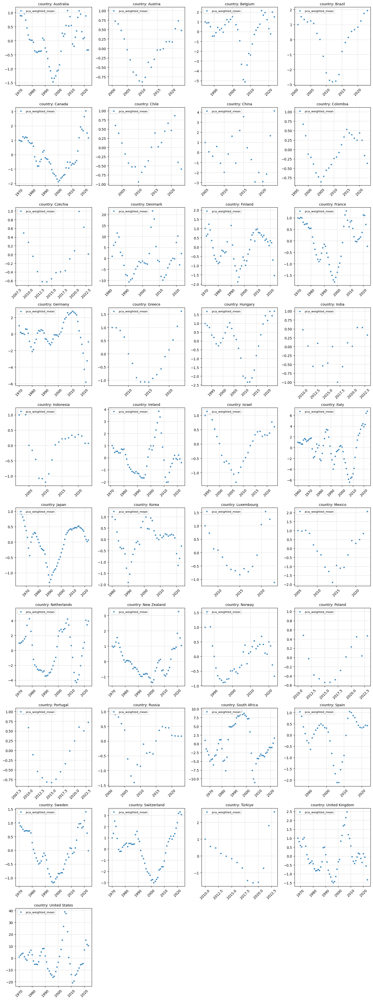

In [258]:
plot_time_series(cycles_processed_filter_eoy_interpolated_hp_pca, "country", cycles_processed_filter_eoy_interpolated_hp_pca['country'].unique(), ['pca_weighted_mean'], col_date='year')

# BBQ algorithm

In [259]:
import pandas as pd
import numpy as np
from scipy.signal import find_peaks

def bbq_algorithm_per_country(df, column_name, category='country', date_column='year', 
                             cycle_duration_min=3, phase_duration_min=5, window_size=5):
    """
    Applies the BBQ algorithm to detect economic turning points (peaks and troughs)
    for each country (or category) in a time series.
    
    :param df: DataFrame containing the time series data.
    :param column_name: Name of the column to analyze.
    :param category: Categorical column (e.g., 'country').
    :param date_column: Column containing the date (default 'year').
    :param cycle_duration_min: Minimum cycle duration in periods.
    :param phase_duration_min: Minimum phase duration in periods.
    :param window_size: Size of the window for peak/trough detection.
    :return: DataFrame with turning points for each country.
    """
    turning_points_all_countries = []
    
    # Iterate over each unique category (e.g., country)
    for country_value in df[category].unique():
        df_per_country = df[df[category] == country_value].sort_values(by=date_column)
        
        # Extract the series
        series = df_per_country[column_name].values
        
        # Detect peaks (maxima) with prominence and width based on window_size
        peaks, properties_peaks = find_peaks(series, distance=cycle_duration_min, prominence=window_size, width=window_size)
        
        # Detect troughs (minima) by inverting the series
        troughs, properties_troughs = find_peaks(-series, distance=cycle_duration_min, prominence=window_size, width=window_size)
        
        # Combine peak and trough indices
        all_indices = np.concatenate([peaks, troughs])
        
        if len(all_indices) == 0:
            # No peaks or troughs detected for this country; skip it
            continue
        
        # Create DataFrame for turning points
        turning_points = pd.DataFrame({
            'date': df_per_country[date_column].iloc[all_indices].values,
            'turning_point': ['peak' if idx in peaks else 'trough' for idx in all_indices],
            'value': series[all_indices],
            category: country_value  # To differentiate each country
        }).sort_values(by='date').reset_index(drop=True)
        
        # Filter turning points based on cycle and phase durations
        valid_turning_points = []
        for i in range(1, len(turning_points)):
            prev_point = turning_points.iloc[i - 1]
            curr_point = turning_points.iloc[i]
            
            # Check for valid cycle duration (trough to peak or peak to trough)
            if (curr_point['turning_point'] == 'peak' and prev_point['turning_point'] == 'trough') or \
               (curr_point['turning_point'] == 'trough' and prev_point['turning_point'] == 'peak'):
                cycle_duration = curr_point['date'] - prev_point['date']
                if cycle_duration >= cycle_duration_min:
                    valid_turning_points.extend([prev_point, curr_point])
            
            # Check for valid phase duration (peak to peak or trough to trough)
            if (curr_point['turning_point'] == 'peak' and prev_point['turning_point'] == 'peak') or \
               (curr_point['turning_point'] == 'trough' and prev_point['turning_point'] == 'trough'):
                phase_duration = curr_point['date'] - prev_point['date']
                if phase_duration >= phase_duration_min:
                    valid_turning_points.append(curr_point)
        
        valid_turning_points_df = pd.DataFrame(valid_turning_points).drop_duplicates()
        
        # If there are valid turning points, add them to the list
        if not valid_turning_points_df.empty:
            turning_points_all_countries.append(valid_turning_points_df)
    
    # Combine all countries' turning points into a single DataFrame
    if turning_points_all_countries:
        return pd.concat(turning_points_all_countries, ignore_index=True)
    else:
        # If no turning points are found for any country, return an empty DataFrame
        return pd.DataFrame(columns=[date_column, 'turning_point', 'value', category])


In [260]:
turning_points_df = bbq_algorithm_per_country(cycles_processed_filter_eoy_interpolated_hp_pca, column_name='pca_weighted_mean', date_column='year', cycle_duration_min=2, phase_duration_min=1, window_size=0.5)
turning_points_df.rename(columns={
  'date': 'year'
}, inplace=True)

In [261]:
turning_points_df

,year,turning_point,value,country
0,1984,trough,-0.413856,Australia
1,1988,peak,0.094588,Australia
2,1996,trough,-1.460309,Australia
3,2007,peak,1.069026,Australia
4,2012,trough,-0.199145,Australia
...,...,...,...,...
128,1989,peak,8.099235,United States
129,1996,trough,-16.108869,United States
130,2005,peak,38.997804,United States
131,2011,trough,-20.867963,United States


In [262]:
cycles_processed_filter_eoy_interpolated_hp_pca_bbq = pd.merge(cycles_processed_filter_eoy_interpolated_hp_pca, turning_points_df, how='left', on=['year', 'country'])
cycles_processed_filter_eoy_interpolated_hp_pca_bbq['turning_point'] = cycles_processed_filter_eoy_interpolated_hp_pca_bbq['turning_point'].fillna('')
cycles_processed_filter_eoy_interpolated_hp_pca_bbq['value'] = cycles_processed_filter_eoy_interpolated_hp_pca_bbq['value'].fillna(0)
cycles_processed_filter_eoy_interpolated_hp_pca_bbq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1387 entries, 0 to 1386
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   year                         1387 non-null   int64  
 1   country                      1387 non-null   object 
 2   rpp_value                    1387 non-null   float64
 3   cgdp_value                   1387 non-null   float64
 4   cr_value                     1387 non-null   float64
 5   spr_value                    1387 non-null   float64
 6   rpp_value_trend              1387 non-null   float64
 7   rpp_value_cycle              1387 non-null   float64
 8   rpp_value_cycle_normalized   1387 non-null   float64
 9   cgdp_value_trend             1387 non-null   float64
 10  cgdp_value_cycle             1387 non-null   float64
 11  cgdp_value_cycle_normalized  1387 non-null   float64
 12  cr_value_trend               1387 non-null   float64
 13  cr_value_cycle    

In [263]:


# Step 1: Identify countries with at least one 'peak' or 'trough'
countries_with_turning_points = cycles_processed_filter_eoy_interpolated_hp_pca_bbq.loc[
    cycles_processed_filter_eoy_interpolated_hp_pca_bbq['turning_point'].isin(['peak', 'trough']), 'country'
].unique()

# Step 2: Identify all unique countries in the DataFrame
all_countries = cycles_processed_filter_eoy_interpolated_hp_pca_bbq['country'].unique()

# Step 3: Determine countries to remove (those not in 'countries_with_turning_points')
countries_to_remove = set(all_countries) - set(countries_with_turning_points)

# Optional: Display the countries to be removed
print(f"Countries to remove ({len(countries_to_remove)}): {countries_to_remove}")

# Step 4: Filter the DataFrame to exclude these countries
cycles_processed_filter_eoy_interpolated_hp_pca_bbq = cycles_processed_filter_eoy_interpolated_hp_pca_bbq[cycles_processed_filter_eoy_interpolated_hp_pca_bbq['country'].isin(countries_with_turning_points)]

# Step 5: Verify the filtering
print(f"Number of countries before filtering: {len(all_countries)}")
print(f"Number of countries after filtering: {cycles_processed_filter_eoy_interpolated_hp_pca_bbq['country'].nunique()}")




Countries to remove (9): {'Israel', 'Portugal', 'Türkiye', 'Greece', 'Poland', 'Russia', 'Austria', 'Mexico', 'Indonesia'}
Number of countries before filtering: 37
Number of countries after filtering: 28


In [264]:
cycles_processed_filter_eoy_interpolated_hp_pca_bbq.head()

,year,country,rpp_value,cgdp_value,cr_value,spr_value,rpp_value_trend,rpp_value_cycle,rpp_value_cycle_normalized,cgdp_value_trend,...,cgdp_value_cycle_normalized,cr_value_trend,cr_value_cycle,cr_value_cycle_normalized,spr_value_trend,spr_value_cycle,spr_value_cycle_normalized,pca_weighted_mean,turning_point,value
0,1970,Australia,32.4367,62.4,9.763825,66.374039,17.341553,15.095147,1.000000,56.486108,...,1.000000,-10.215356,19.979181,1.000000,34.124205,32.249834,1.000000,1.000000,,0.0
1,1971,Australia,34.1111,61.8,10.055262,61.761449,19.203306,14.907794,0.987589,59.299733,...,0.422779,-7.646934,17.702196,0.886032,35.588990,26.172459,0.811553,0.896601,,0.0
2,1972,Australia,36.7062,62.7,10.501544,73.306428,21.065096,15.641104,1.036168,62.113373,...,0.099195,-5.078462,15.580006,0.779812,37.053855,36.252573,1.124117,0.885048,,0.0
3,1973,Australia,41.0876,67.2,12.216656,52.346214,22.926999,18.160601,1.203075,64.927049,...,0.384341,-2.509845,14.726501,0.737092,38.518947,13.827267,0.428755,1.056407,,0.0
4,1974,Australia,40.1630,72.4,13.607510,30.332724,24.789129,15.373871,1.018465,67.740783,...,0.787843,0.059049,13.548461,0.678129,39.984503,-9.651779,-0.299281,0.961808,,0.0


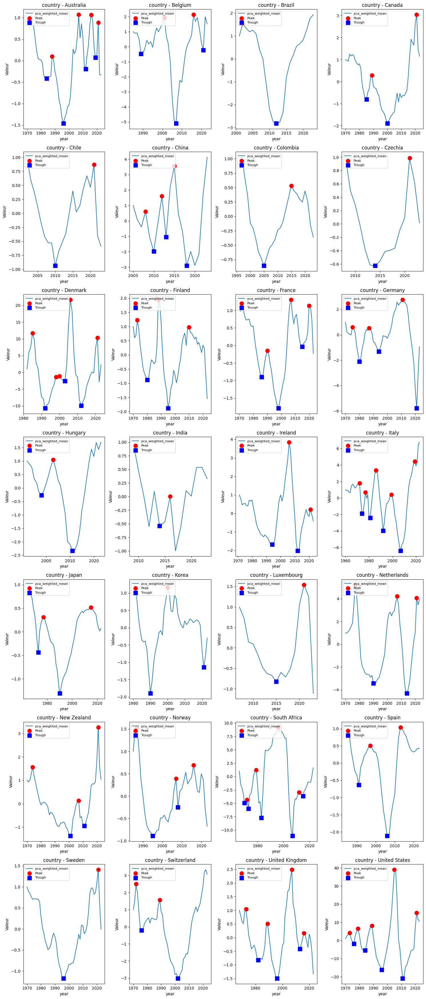

In [265]:
df = cycles_processed_filter_eoy_interpolated_hp_pca_bbq
category = 'country'
cols=4
date_column = 'year'
selected_variables = ['pca_weighted_mean']

# Déterminer le nombre de pays et la disposition des subplots
countries = df[category].unique()
n_subplots = len(countries)
rows = (n_subplots + cols - 1) // cols  # Calcul du nombre de lignes nécessaires pour les subplots

# Créer les subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.flatten()  # Aplatir les axes pour itérer facilement

# Si nécessaire, définir une palette de couleurs différentes
cmap = plt.get_cmap('tab20' if len(selected_variables) > 10 else 'tab10')
couleurs = [cmap(i / max(len(selected_variables) - 1, 1)) for i in range(len(selected_variables))]

for i, country in enumerate(countries):
  # Sélectionner les données pour le pays actuel
  df_per_country = df[df[category] == country]
  
  # Parcourir chaque variable à tracer
  for var, color in zip(selected_variables, couleurs):
    x = df_per_country[date_column]
    y = df_per_country[var]
    
    # Tracer les séries temporelles de chaque variable
    axes[i].plot(x, y, label=var, color=color)
  
  # Tracer les turning points (pics et creux)
  if 'turning_point' in df_per_country.columns and 'value' in df_per_country.columns:
    peaks = df_per_country[df_per_country['turning_point'] == 'peak']
    troughs = df_per_country[df_per_country['turning_point'] == 'trough']
    
    # Tracer les pics (maxima)
    axes[i].scatter(peaks[date_column], peaks['value'], color='red', label='Peak', zorder=5, marker='o', s=100)
    
    # Tracer les creux (minima)
    axes[i].scatter(troughs[date_column], troughs['value'], color='blue', label='Trough', zorder=5, marker='s', s=100)
      
  
  # Configurer chaque subplot
  axes[i].set_title(f"{category} - {country}")
  axes[i].set_xlabel(date_column)
  axes[i].set_ylabel('Valeur')
  axes[i].legend(loc='upper left', fontsize=8)
    
# Supprimer les axes inutilisés (si le nombre de pays n'est pas un multiple de cols)
for i in range(n_subplots, len(axes)):
  fig.delaxes(axes[i])

# Ajuster l'espacement et afficher le graphique
plt.tight_layout()
plt.show()

In [266]:
cycles_processed_filter_eoy_interpolated_hp_pca_bbq.to_csv('./data/cycles_processed.csv', index=False)